In [9]:
import spotiphy
import numpy as np
import matplotlib as mpl
import squidpy as sq
import scanpy as sc
from scipy.stats import ttest_ind
import importlib as imp
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

In [81]:
sample = 'TYRS3_TB_22_11917_spatial1'
adata_sc = sc.read_h5ad('F:/Ziqian Zheng/Spotiphy_data/ATRT/scRNA/'+sample+'/TYRS3_sc.h5ad')
adata_sc_copy = adata_sc.copy()
adata_st = sc.read_visium('F:/Ziqian Zheng/Spotiphy_data/ST/ATRT/'+sample+'/outs')
adata_st.var_names_make_unique()
results_folder = 'results/ATRT/'+sample+'/'
adata_sc.obs.head()
key_type = 'celltype'
type_list = sorted(list(adata_sc.obs[key_type].unique()))
print(f'There are {len(type_list)} cell types: {type_list}')

anndata.py (1832): Variable names are not unique. To make them unique, call `.var_names_make_unique`.


There are 11 cell types: ['APCs', 'Astrocytes', 'BMDM', 'Dopaminergic', 'Fibroblast-like', 'GABAergic', 'GRPs_like_TYR3', 'Glutamatergic', 'Microglia', 'OLs', 'Pre_OLs']


In [82]:
# adata_sc.obs['CellType_zz'] = adata_sc.obs['CellType_xy2']
# for i in range(len(adata_sc)):
#     if adata_sc.obs['CellType_xy2'][i] not in ['Mesenchymal_like_tumor', 'Non-malignant']:
#         adata_sc.obs.iloc[i, -1] = 'tumor'
# adata_sc.obs['CellType_zz'].unique()
# key_type = 'CellType_zz'
# type_list = sorted(list(adata_sc.obs[key_type].unique()))
# print(f'There are {len(type_list)} cell types: {type_list}')

In [83]:
adata_sc, adata_st = spotiphy.initialization(adata_sc, adata_st, verbose=1)
adata_sc_orig = adata_sc.copy()
adata_st_orig = adata_st.copy()

Convert expression matrix to array: 0.11s
Normalization: 5.78s
Filtering: 8.13s
Find common genes: 0.44s


In [84]:
marker_gene_dict = spotiphy.sc_reference.marker_selection_1(adata_sc, key_type=key_type, return_dict=True, n_select=50,
                                                            threshold_p=0.1, threshold_fold=1.5, q=0.15)
marker_gene = []
marker_gene_label = []
for type_ in type_list:
    marker_gene.extend(marker_gene_dict[type_])
    marker_gene_label.extend([type_]*len(marker_gene_dict[type_]))
marker_gene_df = pd.DataFrame({'gene':marker_gene, 'label':marker_gene_label})
marker_gene_df.to_csv(results_folder+'marker_gene.csv')
adata_sc = adata_sc[:, marker_gene]
adata_st = adata_st[:, marker_gene]

11it [00:00, 84.62it/s]


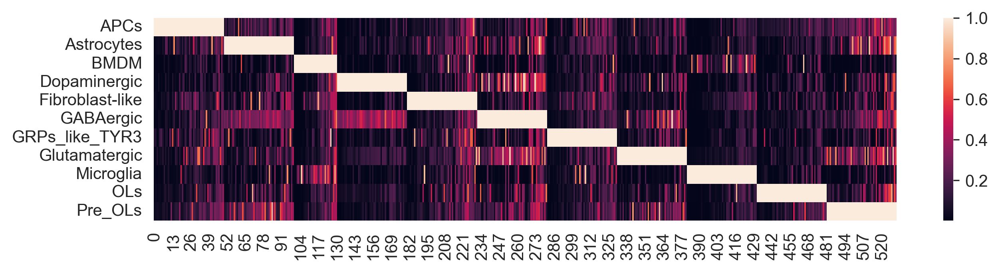

In [85]:
sc_ref = spotiphy.construct_sc_ref(adata_sc, key_type=key_type)
spotiphy.sc_reference.plot_heatmap(adata_sc, key_type, save=True, out_dir=results_folder)

100%|██████████| 8000/8000 [04:36<00:00, 28.90it/s]


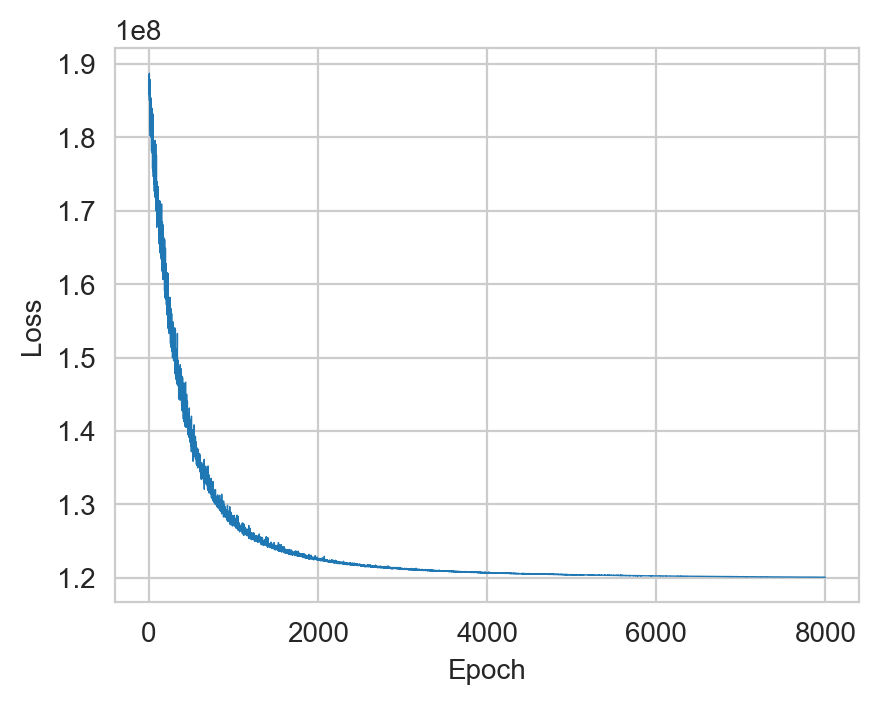

1521618971.py (8): Trying to modify attribute `.obs` of view, initializing view as actual.


In [86]:
X = np.array(adata_st.X)
pyro_params = spotiphy.deconvolution.deconvolute(X, sc_ref, n_epoch=8000, plot=True, batch_prior=1)
sigma = pyro_params['sigma'].cpu().detach().numpy()
mean_exp = np.array([np.mean(np.sum(adata_sc.X[adata_sc.obs[key_type]==type_list[i]], axis=1))
                     for i in range(len(type_list))])
cell_proportion = sigma/mean_exp
cell_proportion = cell_proportion/np.sum(cell_proportion, axis=1)[:, np.newaxis]
adata_st.obs[type_list] = cell_proportion
np.save(results_folder+'proportion.npy', cell_proportion)

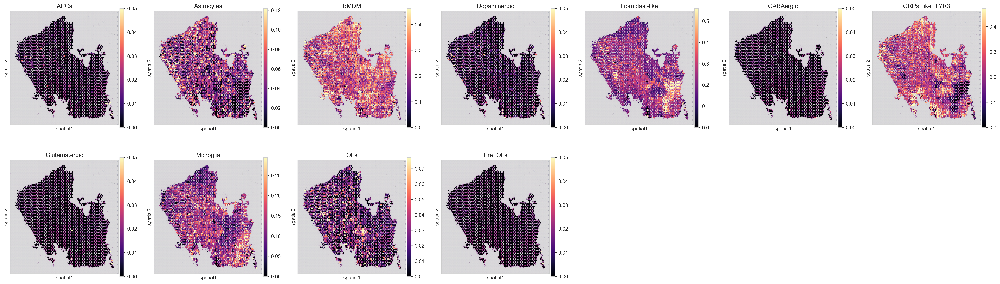

In [87]:
cell_proportion = np.load(results_folder+'proportion.npy')
adata_st.obs[type_list] = cell_proportion
type_list_order = type_list
vmax = np.quantile(adata_st.obs[type_list_order].values, 0.97, axis=0)
vmax[vmax<0.05] = 0.05
adata_st.var.rename(index={'Lamp5': 'Lamp5_g', 'Pvalb': 'Pvalb_g', 'Sst': 'Sst_g', 'Vip': 'Vip_g', 'Sncg': 'Sncg_g'},
                    inplace=True)
with mpl.rc_context({'figure.figsize': [4, 4.5], 'figure.dpi': 400}):
    ax = sc.pl.spatial(adata_st, cmap='magma', color=type_list_order, img_key='hires', vmin=0, vmax=list(vmax), ncols=7,
                       size=1.3, show=False)
    ax[0].get_figure().savefig(results_folder+'spotiphy.jpg', bbox_inches='tight')